# One Year Mortality Prediction of Patients with Hip Replacement SUrgery

## import libraries

In [ ]:

from catboost import CatBoostClassifier
from imblearn.over_sampling import SMOTE
from pytorch_tabnet.tab_model import TabNetClassifier
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.datasets import make_classification
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.impute import KNNImputer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (accuracy_score, f1_score, recall_score, precision_score, roc_auc_score, confusion_matrix)
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from tab_transformer_pytorch import TabTransformer
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import shap
import torch
import torch.nn as nn
import torch.optim as optim
plt.rcParams['figure.dpi'] = 300  

## read the data

In [3]:
df = pd.read_excel('/Users/ashuchami/Documents/phd/shiba/mortality_1year_new.xlsx', sheet_name='mortality1year')

# Replace "missing" and blank spaces with NaN for object columns
df.loc[:, df.select_dtypes(include=['object']).columns] = df.select_dtypes(include=['object']).apply(lambda x: x.replace(['missing', ' '], np.nan))

# Convert int64 columns to float64
for column in df.select_dtypes(include=['int64']).columns:
    df[column] = df[column].astype('float64')
    
df['intraop_tramadol'] = df['intraop_tramadol'].replace(" ", np.nan)

/var/folders/xk/5f5pk9410_9_hs0mdshdzm2h0000gn/T/ipykernel_4011/2805565645.py:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df.loc[:, df.select_dtypes(include=['object']).columns] = df.select_dtypes(include=['object']).apply(lambda x: x.replace(['missing', ' '], np.nan))


In [4]:
# Group columns by their data types
columns_by_dtype = df.dtypes.groupby(df.dtypes).groups

# Print columns for each data type
for dtype, columns in columns_by_dtype.items():
    print(f"Data type: {dtype}")
    print(f"Columns: {list(columns)}\n")
    

Data type: float64
Columns: ['age', 'sex', 'country_of_birth', 'height', 'weight', 'bmi', 'cognition', 'consciousness', 'functional_status', 'cohabilitation', 'mobility', 'er_time_h', 'er_pnb', 'baseline_creatinine', 'baseline_urea', 'baseline_sodium', 'baseline_potassium', 'baseline_lactate', 'baseline_ph', 'baseline_hco3', 'baseline_base_excess', 'baseline_troponin', 'baseline_crp', 'baseline_hb', 'baseline_wbc', 'baseline_lymph', 'baseline_plt', 'baseline_albumin', 'baseline_glucose', 'baseline_inr', 'baseline_ptt', 'baseline_fib', 'ejection_fraction', 'as_ava_moderate', 'as_ava_severe_critical', 'as_pressuregradient_moderate', 'as_pressuregradient_severe_critical', 'aortic_valve_summary', 'rv_function', 'spo2_dept_first_less93', 'dbp_dept_first_less60', 'dbp_dept_first_more_110', 'sbp_dept_first_less90', 'sbp_dept_first_more180', 'spo2_dept_last_less93', 'dbp_dept_last_less60', 'dbp_dept_last_more110', 'sbp_dept_last_less90', 'sbp_dept_last_more180', 'temp_dept_first_less36', 'temp

## format Feature names

In [5]:
def format_feature_name(name):
    """
    Replaces underscores with spaces and capitalizes the first letter of the name.
    """
    return name.replace('_', ' ').capitalize()

print(format_feature_name("number_of_customers"))  # Output: "Number of customers"

Number of customers


## heatmap correlation matrix

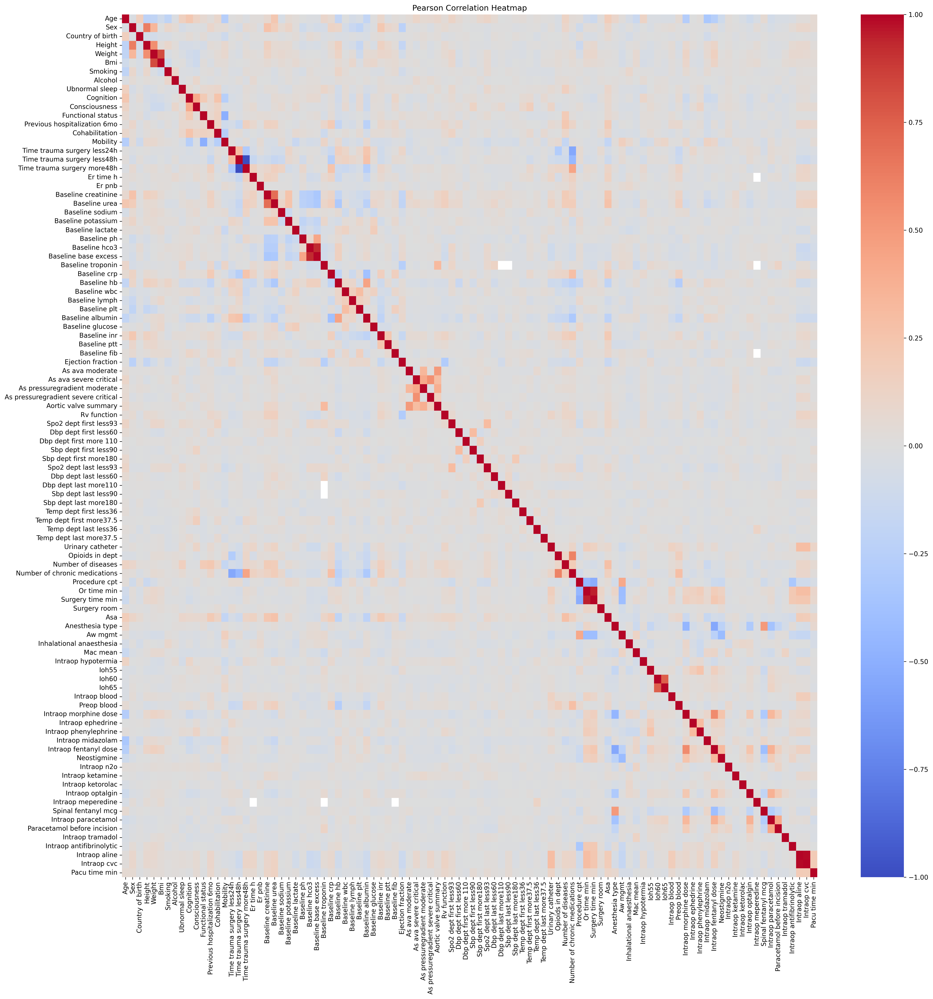

In [6]:
# Specify the columns to exclude
columns_to_exclude = ['patient_id', 'outcome_death_1y']

# Create a new DataFrame excluding the specified columns
df_filtered = df.drop(columns=columns_to_exclude)

# Calculate the Pearson correlation matrix
correlation_matrix = df_filtered.corr()
correlation_matrix = correlation_matrix.rename(index=format_feature_name, columns=format_feature_name)

# Plot the heatmap
plt.figure(figsize=(24, 24))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', fmt='.2f', cbar=True)
plt.title("Pearson Correlation Heatmap")
plt.show()

## plot feature distribution 

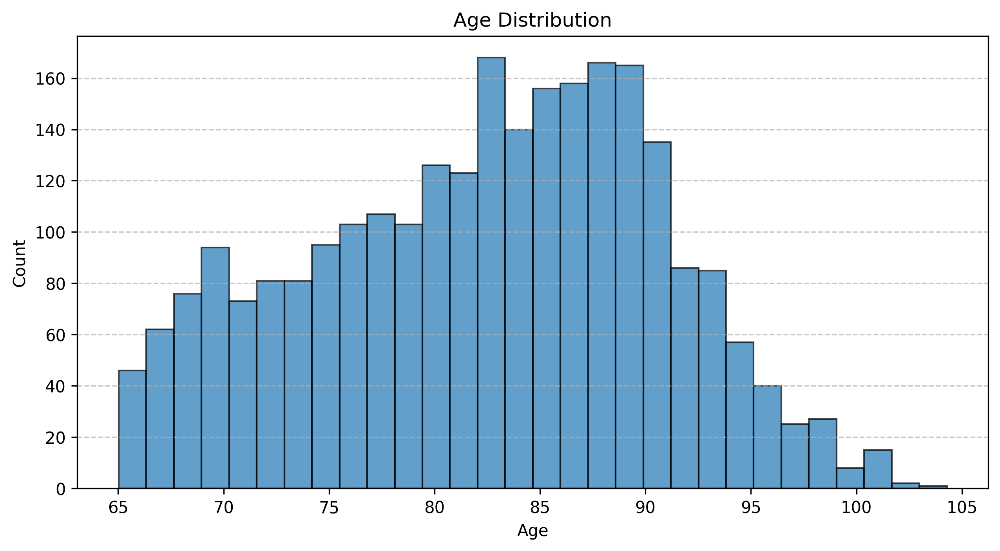

In [7]:
# Plot histogram to visualize the distribution of 'age'
plt.figure(figsize=(10, 5))
plt.hist(df['age'], bins=30, edgecolor='black', alpha=0.7)
plt.xlabel('Age')
plt.ylabel('Count')
plt.title('Age Distribution')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

## define models and functions

In [8]:
# Function to plot feature importance
def plot_feature_importance(model, X_test, y_test, feature_names, model_name, smote_used):
    result = permutation_importance(model, X_test, y_test, n_repeats=10, random_state=42)
    sorted_idx = result.importances_mean.argsort()
    
    plt.figure(figsize=(6, 16))
    plt.barh(range(len(sorted_idx)), result.importances_mean[sorted_idx], align='center')
    plt.yticks(range(len(sorted_idx)), [feature_names[i] for i in sorted_idx])
    plt.xlabel('Permutation Importance')
   # Add title
    smote_text = " with SMOTE" if smote_used else ""
    plt.title(f'Feature Importance for {model_name}{smote_text}')
    plt.show()

def plot_shap_values(model, X_test, feature_names,  model_name, smote_used):
    # Determine the appropriate SHAP explainer based on the model type
    if isinstance(model, LogisticRegression):
        explainer = shap.LinearExplainer(model, X_test)
    elif isinstance(model, (DecisionTreeClassifier, RandomForestClassifier)):
        explainer = shap.TreeExplainer(model)
    elif isinstance(model, XGBClassifier):
        explainer = shap.TreeExplainer(model)
    elif isinstance(model, MLPClassifier):
        explainer = shap.KernelExplainer(model.predict_proba, X_test)
    else:
        raise ValueError(f"SHAP does not support the model type {type(model).__name__}")
    
    # Compute SHAP values
    shap_values = explainer(X_test)
         
    # Debug: Print the shape of shap_values
    print(f"Shape of shap_values: {np.array(shap_values).shape}")
    
    # Handle binary classification
    if isinstance(shap_values, list) and len(shap_values) == 2:
        # For binary classification, extract SHAP values for the positive class (class 1)
        shap_values_positive = shap_values[1]  # Use SHAP values for the positive class
    else:
        # For non-binary or other cases, use the SHAP values directly
        shap_values_positive = shap_values
    
    # Ensure SHAP values are in the correct format (2D array)
    if len(shap_values_positive.shape) == 1:
        # Reshape to 2D if necessary
        shap_values_positive = shap_values_positive.reshape(-1, X.shape[1])
    # Plot SHAP summary plot
    smote_text = " with SMOTE" if smote_used else ""
    plt.figure(figsize=(8, 6))
    plt.title(f'SHAP Summary Plot for {model_name}{smote_text}')
    shap.summary_plot(shap_values_positive, X_test, feature_names=feature_names, max_display=10)

def plot_roc_curve(model, X_train, y_train, X_test, y_test,  model_name, smote_used):
    # Predict probabilities for train and test datasets
    y_prob_train = model.predict_proba(X_train)[:, 1]
    y_prob_test = model.predict_proba(X_test)[:, 1]
    
    # Compute ROC curve and AUC for train data
    fpr_train, tpr_train, _ = roc_curve(y_train, y_prob_train)
    auc_train = auc(fpr_train, tpr_train)
    
    # Compute ROC curve and AUC for test data
    fpr_test, tpr_test, _ = roc_curve(y_test, y_prob_test)
    auc_test = auc(fpr_test, tpr_test)
      # Plot ROC curves
    smote_text = " with SMOTE" if smote_used else ""
    # Plot ROC curves
    plt.figure(figsize=(8, 6))
    plt.plot(fpr_train, tpr_train, label=f'Train ROC Curve (AUC = {auc_train:.2f})', color='blue')
    plt.plot(fpr_test, tpr_test, label=f'Validation ROC Curve (AUC = {auc_test:.2f})', color='red')
    plt.plot([0, 1], [0, 1], 'k--', label='Random Chance')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve for {model_name}{smote_text}')
    plt.legend(loc='lower right')
    plt.grid()
    plt.show()
    

def evaluate_model(model, X_test, y_test):
    # Check if the model requires numpy arrays (e.g., TabNet) or pandas DataFrames (e.g., TabTransformer)
    if hasattr(model, 'predict') and 'TabNet' in str(type(model)):
        # For TabNet, convert X_test to numpy array
        X_test_input = X_test.values
    else:
        # For other models (e.g., TabTransformer), keep X_test as a pandas DataFrame
        X_test_input = X_test
    
    # Predictions
    y_pred = model.predict(X_test_input)
    
    # Probabilities (if available)
    if hasattr(model, 'predict_proba'):
        y_prob = model.predict_proba(X_test_input)[:, 1]
    elif hasattr(model, 'predict') and 'TabNet' in str(type(model)):
        # Handle TabNet's case where probabilities are not directly available
        y_prob = model.predict(X_test_input)  # Assuming TabNet outputs probabilities directly
    else:
        y_prob = np.zeros_like(y_pred)
    
    # Metrics
    accuracy = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_prob) if np.any(y_prob) else 0  # Avoid AUC calculation if all probabilities are zero
    
    # Confusion matrix
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    fpr = fp / (fp + tn) if (fp + tn) > 0 else 0
    tnr = tn / (tn + fp) if (tn + fp) > 0 else 0
    
    return {
        'Accuracy': accuracy,
        'F1 Score': f1,
        'Recall': recall,
        'Precision': precision,
        'False Positive Rate': fpr,
        'True Negative Rate': tnr,
        'AUC': auc
    }


# Custom wrapper for TabTransformer
class TabTransformerWrapper(BaseEstimator, ClassifierMixin):
    def __init__(self, categories, num_continuous, dim=32, depth=6, heads=8, attn_dropout=0.1, ff_dropout=0.1, epochs=10, lr=0.001):
        self.categories = categories
        self.num_continuous = num_continuous
        self.dim = dim
        self.depth = depth
        self.heads = heads
        self.attn_dropout = attn_dropout
        self.ff_dropout = ff_dropout
        self.epochs = epochs
        self.lr = lr
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.model = None

    def get_params(self, deep=True):
        return {
            "categories": self.categories,
            "num_continuous": self.num_continuous,
            "dim": self.dim,
            "depth": self.depth,
            "heads": self.heads,
            "attn_dropout": self.attn_dropout,
            "ff_dropout": self.ff_dropout,
            "epochs": self.epochs,
            "lr": self.lr,
        }

    def set_params(self, **params):
        for key, value in params.items():
            setattr(self, key, value)
        return self

    def fit(self, X, y):
        # Ensure X and y are in the correct format
        if not isinstance(X, pd.DataFrame):
            X = pd.DataFrame(X)
        if not isinstance(y, pd.Series):
            y = pd.Series(y)

        # Separate categorical and continuous features
        X_categ = X.iloc[:, :len(self.categories)].values  # Convert to NumPy array
        X_cont = X.iloc[:, len(self.categories):].values

        # Convert data to tensors
        X_categ_tensor = torch.tensor(X_categ, dtype=torch.long).to(self.device)
        X_cont_tensor = torch.tensor(X_cont, dtype=torch.float32).to(self.device)
        y_tensor = torch.tensor(y.values, dtype=torch.long).to(self.device)

        # Initialize model
        self.model = TabTransformer(
            categories=self.categories,
            num_continuous=self.num_continuous,
            dim=self.dim,
            dim_out=1,  # Binary classification
            depth=self.depth,
            heads=self.heads,
            attn_dropout=self.attn_dropout,
            ff_dropout=self.ff_dropout
        ).to(self.device)

        # Define loss and optimizer
        criterion = nn.BCEWithLogitsLoss()  # Binary classification loss
        optimizer = optim.Adam(self.model.parameters(), lr=self.lr)

        # Training loop
        self.model.train()
        for epoch in range(self.epochs):
            optimizer.zero_grad()
            output = self.model(X_categ_tensor, X_cont_tensor).squeeze()  # Squeeze to match target shape
            loss = criterion(output, y_tensor.float())
            loss.backward()
            optimizer.step()

        return self

    def predict(self, X):
        # Separate categorical and continuous features
        X_categ = X.iloc[:, :len(self.categories)].values
        X_cont = X.iloc[:, len(self.categories):].values

        # Convert to tensors
        X_categ_tensor = torch.tensor(X_categ, dtype=torch.long).to(self.device)
        X_cont_tensor = torch.tensor(X_cont, dtype=torch.float32).to(self.device)

        self.model.eval()
        with torch.no_grad():
            output = self.model(X_categ_tensor, X_cont_tensor).squeeze()
            preds = torch.sigmoid(output)  # Apply sigmoid for binary classification
            return (preds > 0.5).int().cpu().numpy()  # Convert probabilities to binary predictions

    def score(self, X, y):
        preds = self.predict(X)
        return accuracy_score(y, preds)  # Accuracy score

# Define models and their hyperparameter grids for GridSearchCV
models = {
    'Logistic Regression': {
        'model': LogisticRegression(max_iter=1000),
        'params': {'C': [0.01, 0.1, 1, 10], 'penalty': ['l2']}
    },
    'Naive Bayes': {
        'model': GaussianNB(),
        'params': {}
    },
    'K-Nearest Neighbors': {
        'model': KNeighborsClassifier(),
        'params': {'n_neighbors': [3, 5, 7, 10], 'weights': ['uniform', 'distance']}
    },
    'Support Vector Machine': {
        'model': SVC(probability=True),
        'params': {'C': [0.1, 1, 10], 'kernel': ['linear', 'rbf']}
    },
    'Decision Tree': {
        'model': DecisionTreeClassifier(),
        'params': {'max_depth': [3, 5, 7, 10], 'min_samples_split': [2, 5, 10]}
    },
    'Random Forest': {
        'model': RandomForestClassifier(),
        'params': {
            'n_estimators': [50, 100],
            'max_depth': [3, 5, 7],
            'min_samples_split': [5, 10, 15],
            'min_samples_leaf': [2, 4, 6],
            'max_features': ['sqrt', 'log2'],
            'bootstrap': [True]
        }
    },
    'XGBoost': {
        'model': XGBClassifier(eval_metric='logloss'),
        'params': {
            'n_estimators': [50, 100, 200],
            'max_depth': [3, 5],
            'learning_rate': [0.01, 0.05, 0.1],
            'subsample': [0.8, 0.9],
            'colsample_bytree': [0.8, 0.9],
            'reg_alpha': [0, 0.1, 1],
            'reg_lambda': [0, 0.1, 1]
        }
    },
    'MLP': {
        'model': MLPClassifier(max_iter=1000, early_stopping=True),
        'params': {
            'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 50)],
            'alpha': [0.0001, 0.001, 0.01, 0.1],
            'learning_rate': ['constant', 'adaptive'],
            'activation': ['relu', 'tanh']
        }
    },
    'TabNet': {
        'model': TabNetClassifier(),
        'params': {
            'n_d': [8, 16, 24],
            'n_a': [8, 16, 24],
            'n_steps': [3, 5],
            'gamma': [1.2, 1.5]
        }
    },
'TabTransformer': {
        'model': TabTransformerWrapper(
            categories=[3, 3, 3, 3, 3, 3, 3, 3, 3],  # Number of unique values per categorical feature
            num_continuous=89,
            dim=32,
            depth=6,
            heads=8,
            attn_dropout=0.1,
            ff_dropout=0.1,
            epochs=10,
            lr=0.001
        ),
        'params': {
            'dim': [16, 32, 64],
            'depth': [4, 6, 8],
            'heads': [4, 8],
            'epochs': [10, 20]
        }
    }
}




/Users/ashuchami/miniconda3/envs/machine_learning/lib/python3.9/site-packages/pytorch_tabnet/abstract_model.py:82: UserWarning: Device used : cpu
  warnings.warn(f"Device used : {self.device}")


In [9]:
X = df.drop(columns=['outcome_death_1y', 'patient_id'])
y = df['outcome_death_1y']

# Define categorical and continuous columns
categorical_cols = ['smoking', 'alcohol', 'ubnormal_sleep', 'previous_hospitalization_6mo',
                    'time_trauma_surgery_less24h', 'time_trauma_surgery_less48h', 
                    'time_trauma_surgery_more48h', 'intraop_hypotermia', 'intraop_tramadol'] 

continuous_cols = [col for col in X.columns if col not in categorical_cols]

# Label Encode categorical columns
for col in categorical_cols:
    le = LabelEncoder()
    X[col] = le.fit_transform(X[col].astype(str))  # Convert to string before encoding to handle NaNs


imputer = KNNImputer(n_neighbors=5)
X[continuous_cols] = imputer.fit_transform(X[continuous_cols])  # Apply imputer to continuous features only

# Standardize the continuous features
scaler = StandardScaler()
X[continuous_cols] = scaler.fit_transform(X[continuous_cols])

# Ensure categorical features remain integers
X[categorical_cols] = X[categorical_cols].astype(int)


# Create temporary age bins
age_bins = pd.cut(df['age'], bins=[65, 80, 100, 105], labels=False)  # Broad bins
stratify_groups = list(zip(age_bins, df['sex']))

# Split the data into train and test sets (80-20%)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, 
                                                    random_state=42, stratify=stratify_groups)



## train and test models no SMOTE

In [10]:

# Dictionaries to store best scores and hyperparameters
best_scores = {}
best_hyperparams = {}
best_models = {}


# Train models and find best hyperparameters
for model_name, model_info in models.items():
    print(f"Training {model_name}...")
    if model_name == 'TabTransformer':
        # Skip GridSearchCV for TabTransformer
        model = model_info['model']
        model.fit(X_train, y_train)  # Assuming you have a custom fit method for TabTransformer
        best_model = model
        best_hyperparams[model_name] = {}
    
    elif model_name == 'TabNet':
        # Handle TabNet separately
        model = model_info['model']
        # Assuming TabNet requires a specific data format or fit method
        model.fit(
            X_train.values, y_train.values,  # Convert to numpy arrays if necessary
            eval_set=[(X_test.values, y_test.values)]  # Example for evaluation set
        )
        best_model = model
        best_hyperparams[model_name] = {}
    
    else:
        # Use GridSearchCV for other models
        grid_search = GridSearchCV(model_info['model'], model_info['params'], scoring='accuracy', cv=5, n_jobs=-1)
        grid_search.fit(X_train, y_train)
        best_model = grid_search.best_estimator_
        best_hyperparams[model_name] = grid_search.best_params_

    # Evaluate the model
    scores = evaluate_model(best_model, X_test, y_test)
    best_scores[model_name] = scores
    best_models[model_name] = best_model
    
    print(f"Best Parameters for {model_name}: {best_hyperparams[model_name]}")
    print(f"Best Scores for {model_name}: {scores}\n")



Training Logistic Regression...
Best Parameters for Logistic Regression: {'C': 0.01, 'penalty': 'l2'}
Best Scores for Logistic Regression: {'Accuracy': 0.7658349328214972, 'F1 Score': 0.6280487804878049, 'Recall': 0.553763440860215, 'Precision': 0.7253521126760564, 'False Positive Rate': 0.11641791044776119, 'True Negative Rate': 0.8835820895522388, 'AUC': 0.8375381158722517}

Training Naive Bayes...
Best Parameters for Naive Bayes: {}
Best Scores for Naive Bayes: {'Accuracy': 0.3800383877159309, 'F1 Score': 0.527086383601757, 'Recall': 0.967741935483871, 'Precision': 0.36217303822937624, 'False Positive Rate': 0.9462686567164179, 'True Negative Rate': 0.05373134328358209, 'AUC': 0.7527684159845931}

Training K-Nearest Neighbors...
Best Parameters for K-Nearest Neighbors: {'n_neighbors': 10, 'weights': 'distance'}
Best Scores for K-Nearest Neighbors: {'Accuracy': 0.6928982725527831, 'F1 Score': 0.41605839416058393, 'Recall': 0.3064516129032258, 'Precision': 0.6477272727272727, 'False P

/Users/ashuchami/miniconda3/envs/machine_learning/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/Users/ashuchami/miniconda3/envs/machine_learning/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/Users/ashuchami/miniconda3/envs/machine_learning/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/Users/ashuchami/miniconda3/envs/machine_learning/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/Users/ashuchami/miniconda3/envs/machine_learning/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature na

Best Parameters for MLP: {'activation': 'tanh', 'alpha': 0.01, 'hidden_layer_sizes': (50,), 'learning_rate': 'adaptive'}
Best Scores for MLP: {'Accuracy': 0.7428023032629558, 'F1 Score': 0.6298342541436464, 'Recall': 0.6129032258064516, 'Precision': 0.6477272727272727, 'False Positive Rate': 0.18507462686567164, 'True Negative Rate': 0.8149253731343283, 'AUC': 0.8136735676456428}

Training TabNet...
epoch 0  | loss: 0.86937 | val_0_auc: 0.52173 |  0:00:00s
epoch 1  | loss: 0.74509 | val_0_auc: 0.54901 |  0:00:00s
epoch 2  | loss: 0.70284 | val_0_auc: 0.58474 |  0:00:00s
epoch 3  | loss: 0.68409 | val_0_auc: 0.61087 |  0:00:00s
epoch 4  | loss: 0.66751 | val_0_auc: 0.6289  |  0:00:00s
epoch 5  | loss: 0.66566 | val_0_auc: 0.62616 |  0:00:00s
epoch 6  | loss: 0.66148 | val_0_auc: 0.626   |  0:00:00s
epoch 7  | loss: 0.65391 | val_0_auc: 0.63857 |  0:00:00s
epoch 8  | loss: 0.64763 | val_0_auc: 0.64428 |  0:00:00s
epoch 9  | loss: 0.64431 | val_0_auc: 0.67779 |  0:00:01s
epoch 10 | loss: 

/Users/ashuchami/miniconda3/envs/machine_learning/lib/python3.9/site-packages/pytorch_tabnet/callbacks.py:172: UserWarning: Best weights from best epoch are automatically used!
  warnings.warn(wrn_msg)


Best Parameters for TabNet: {}
Best Scores for TabNet: {'Accuracy': 0.654510556621881, 'F1 Score': 0.1176470588235294, 'Recall': 0.06451612903225806, 'Precision': 0.6666666666666666, 'False Positive Rate': 0.01791044776119403, 'True Negative Rate': 0.982089552238806, 'AUC': 0.7074787353554806}

Training TabTransformer...
Best Parameters for TabTransformer: {}
Best Scores for TabTransformer: {'Accuracy': 0.6525911708253359, 'F1 Score': 0.06217616580310881, 'Recall': 0.03225806451612903, 'Precision': 0.8571428571428571, 'False Positive Rate': 0.0029850746268656717, 'True Negative Rate': 0.9970149253731343, 'AUC': 0}



## train and test models with SMOTE

In [11]:
# Repeat with SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

smote_best_scores = {}
smote_best_hyperparams = {}
smote_best_models = {}


# Train models and find best hyperparameters
for model_name, model_info in models.items():
    print(f"Training with SMOTE {model_name}...")
    if model_name == 'TabTransformer':
        # Skip GridSearchCV for TabTransformer
        model = model_info['model']
        model.fit(X_train_smote, y_train_smote)  # Assuming you have a custom fit method for TabTransformer
        best_model = model
        smote_best_hyperparams[model_name] = {}
    
    elif model_name == 'TabNet':
        # Handle TabNet separately
        model = model_info['model']
        # Assuming TabNet requires a specific data format or fit method
        model.fit(
            X_train_smote.values, y_train_smote.values,  # Convert to numpy arrays if necessary
            eval_set=[(X_test.values, y_test.values)]  # Example for evaluation set
        )
        best_model = model
        smote_best_hyperparams[model_name] = {}
    
    else:
        # Use GridSearchCV for other models
        grid_search = GridSearchCV(model_info['model'], model_info['params'], scoring='accuracy', cv=5, n_jobs=-1)
        grid_search.fit(X_train_smote, y_train_smote)
        best_model = grid_search.best_estimator_
        smote_best_hyperparams[model_name] = grid_search.best_params_

    # Evaluate the model
    scores = evaluate_model(best_model, X_test, y_test)
    smote_best_scores[model_name] = scores
    smote_best_models[model_name] = best_model
    
    print(f"Best Parameters for {model_name}: {smote_best_hyperparams[model_name]}")
    print(f"Best Scores for {model_name}: {scores}\n")
    

Training with SMOTE Logistic Regression...
Best Parameters for Logistic Regression: {'C': 0.01, 'penalty': 'l2'}
Best Scores for Logistic Regression: {'Accuracy': 0.7600767754318618, 'F1 Score': 0.6943765281173594, 'Recall': 0.7634408602150538, 'Precision': 0.6367713004484304, 'False Positive Rate': 0.2417910447761194, 'True Negative Rate': 0.7582089552238805, 'AUC': 0.827395281656235}

Training with SMOTE Naive Bayes...
Best Parameters for Naive Bayes: {}
Best Scores for Naive Bayes: {'Accuracy': 0.3761996161228407, 'F1 Score': 0.5241581259150805, 'Recall': 0.9623655913978495, 'Precision': 0.36016096579476864, 'False Positive Rate': 0.9492537313432836, 'True Negative Rate': 0.050746268656716415, 'AUC': 0.7481142673728134}

Training with SMOTE K-Nearest Neighbors...
Best Parameters for K-Nearest Neighbors: {'n_neighbors': 3, 'weights': 'distance'}
Best Scores for K-Nearest Neighbors: {'Accuracy': 0.5969289827255279, 'F1 Score': 0.5512820512820513, 'Recall': 0.6935483870967742, 'Precisi

/Users/ashuchami/miniconda3/envs/machine_learning/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/Users/ashuchami/miniconda3/envs/machine_learning/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/Users/ashuchami/miniconda3/envs/machine_learning/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/Users/ashuchami/miniconda3/envs/machine_learning/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/Users/ashuchami/miniconda3/envs/machine_learning/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature na

Best Parameters for MLP: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (100, 50), 'learning_rate': 'constant'}
Best Scores for MLP: {'Accuracy': 0.7216890595009597, 'F1 Score': 0.6214099216710183, 'Recall': 0.6397849462365591, 'Precision': 0.6040609137055838, 'False Positive Rate': 0.23283582089552238, 'True Negative Rate': 0.7671641791044777, 'AUC': 0.7841919435082652}

Training with SMOTE TabNet...
epoch 0  | loss: 0.82505 | val_0_auc: 0.48705 |  0:00:00s
epoch 1  | loss: 0.75473 | val_0_auc: 0.50948 |  0:00:00s
epoch 2  | loss: 0.71974 | val_0_auc: 0.56753 |  0:00:00s
epoch 3  | loss: 0.7032  | val_0_auc: 0.58092 |  0:00:00s
epoch 4  | loss: 0.69504 | val_0_auc: 0.58639 |  0:00:00s
epoch 5  | loss: 0.69098 | val_0_auc: 0.5935  |  0:00:00s
epoch 6  | loss: 0.68757 | val_0_auc: 0.57808 |  0:00:00s
epoch 7  | loss: 0.68756 | val_0_auc: 0.58164 |  0:00:00s
epoch 8  | loss: 0.68195 | val_0_auc: 0.58403 |  0:00:00s
epoch 9  | loss: 0.68016 | val_0_auc: 0.58978 |  0:00:00s


/Users/ashuchami/miniconda3/envs/machine_learning/lib/python3.9/site-packages/pytorch_tabnet/callbacks.py:172: UserWarning: Best weights from best epoch are automatically used!
  warnings.warn(wrn_msg)


Best Parameters for TabTransformer: {}
Best Scores for TabTransformer: {'Accuracy': 0.4875239923224568, 'F1 Score': 0.5572139303482587, 'Recall': 0.9032258064516129, 'Precision': 0.4028776978417266, 'False Positive Rate': 0.7432835820895523, 'True Negative Rate': 0.25671641791044775, 'AUC': 0}



## print results

In [12]:
for model_name, scores in best_scores.items():
    print(f'{model_name}, score: {scores}')
for model_name, scores in smote_best_scores.items():
    print(f'{model_name}, score: {scores}') 


for model_name, scores in best_models.items():
    print(f'{model_name}, model: {scores}')
for model_name, scores in smote_best_models.items():
    print(f'{model_name}, model: {scores}') 

Logistic Regression, score: {'Accuracy': 0.7658349328214972, 'F1 Score': 0.6280487804878049, 'Recall': 0.553763440860215, 'Precision': 0.7253521126760564, 'False Positive Rate': 0.11641791044776119, 'True Negative Rate': 0.8835820895522388, 'AUC': 0.8375381158722517}
Naive Bayes, score: {'Accuracy': 0.3800383877159309, 'F1 Score': 0.527086383601757, 'Recall': 0.967741935483871, 'Precision': 0.36217303822937624, 'False Positive Rate': 0.9462686567164179, 'True Negative Rate': 0.05373134328358209, 'AUC': 0.7527684159845931}
K-Nearest Neighbors, score: {'Accuracy': 0.6928982725527831, 'F1 Score': 0.41605839416058393, 'Recall': 0.3064516129032258, 'Precision': 0.6477272727272727, 'False Positive Rate': 0.09253731343283582, 'True Negative Rate': 0.9074626865671642, 'AUC': 0.7522067083935162}
Support Vector Machine, score: {'Accuracy': 0.7504798464491362, 'F1 Score': 0.622093023255814, 'Recall': 0.5752688172043011, 'Precision': 0.6772151898734177, 'False Positive Rate': 0.15223880597014924, 

## get the best model

In [13]:
# Select the best model based on AUC
def get_best_models():
    selected_models = {}
    selected_scores = {}
    selected_params = {}
    for model in best_scores.keys():
        if best_scores[model]['AUC'] >= smote_best_scores[model]['AUC']:
            selected_models[model] = best_models[model]
            selected_scores[model] = best_scores[model]
            selected_params[model] = best_hyperparams[model]
        else:
            selected_models[model] = smote_best_models[model]
            selected_scores[model] = smote_best_scores[model]
            selected_params[model] = smote_best_hyperparams[model]
    return selected_models, selected_scores, selected_params

selected_models, selected_scores, selected_params= get_best_models()

## plot roc curve best models

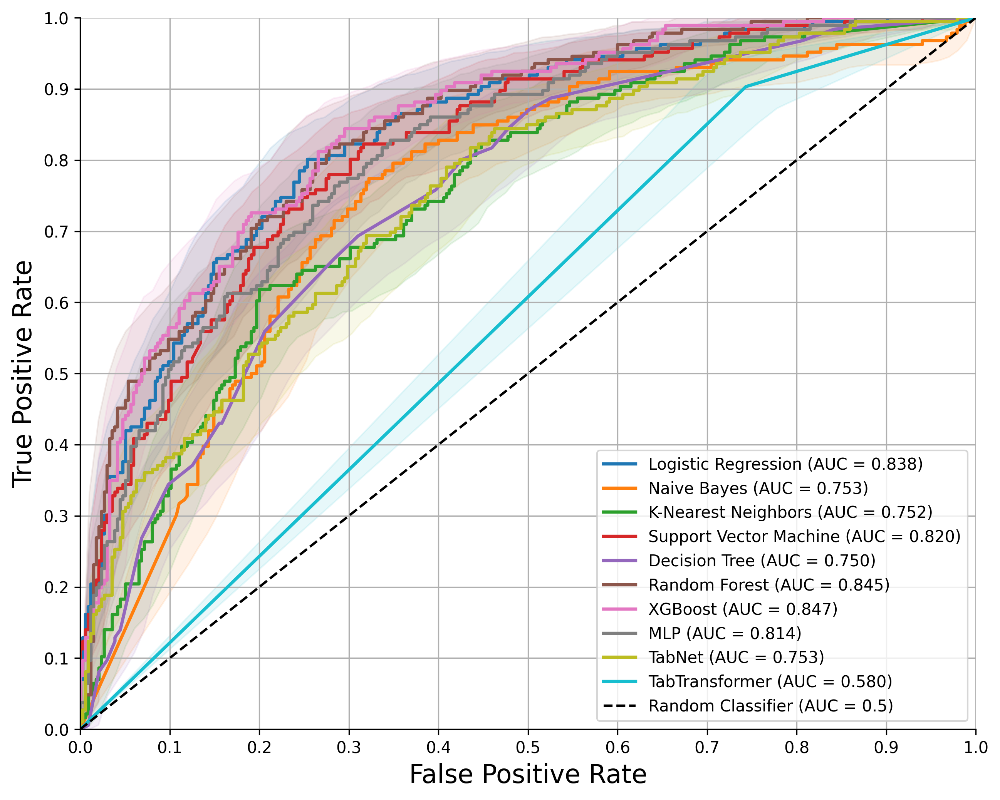

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from scipy.special import expit  # Sigmoid function for probability conversion
import matplotlib.patheffects as PathEffects

# Ensure reproducibility
rng = np.random.RandomState(42)

# Set up the FPR grid for interpolation (you can adjust the number of points)
fpr_grid = np.linspace(0, 1, 100)

plt.figure(figsize=(10, 8))

# Number of bootstrap iterations for estimating the CI
n_bootstraps = 1000

for model_name, model in selected_models.items():
    # Convert X_test to NumPy array if using TabNet
    X_test_input = X_test.values if 'TabNet' in model_name else X_test

    if 'TabTransformer' in model_name:
        # For TabTransformer, use decision_function if available; else use predict
        try:
            y_pred_score = model.decision_function(X_test_input)
            y_pred_prob = expit(y_pred_score)  # Convert scores to probabilities
        except AttributeError:
            y_pred = model.predict(X_test_input)  # Get class predictions
            y_pred_prob = np.clip(y_pred, 0.01, 0.99)  # Approximate probabilities
    else:
        # Standard models that support predict_proba
        y_pred_prob = model.predict_proba(X_test_input)[:, 1]

    # Compute ROC curve and AUC on the full test set
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
    roc_auc = auc(fpr, tpr)
    
    # Initialize list to hold interpolated TPRs from bootstrapping
    bootstrapped_tprs = []
    
    # Bootstrap loop
    for i in range(n_bootstraps):
        # Generate bootstrap sample indices (with replacement)
        indices = rng.randint(0, len(y_test), len(y_test))
        
        # Ensure the bootstrap sample contains both classes
        if len(np.unique(y_test.iloc[indices])) < 2:
            continue

        # Compute ROC for the bootstrap sample
        fpr_bs, tpr_bs, _ = roc_curve(y_test.iloc[indices], y_pred_prob[indices])
        
        # Interpolate the bootstrap TPR over the common FPR grid
        tpr_interp = np.interp(fpr_grid, fpr_bs, tpr_bs)
        tpr_interp[0] = 0.0  # Ensure it starts at 0
        bootstrapped_tprs.append(tpr_interp)

        
    bootstrapped_tprs = np.array(bootstrapped_tprs)
    


    # Calculate the 2.5th and 97.5th percentiles for the TPR at each FPR grid point
    tprs_lower = np.percentile(bootstrapped_tprs, 2.5, axis=0)
    tprs_upper = np.percentile(bootstrapped_tprs, 97.5, axis=0)
    
    # Plot the ROC curve
    line, = plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.3f})')

    # Add a thin black outline to the line
    line.set_path_effects([
        PathEffects.Stroke(linewidth=1, foreground='black'),
        PathEffects.Normal()
    ])
    # Plot the 95% CI as a shaded area with the same color as the ROC curve
    plt.fill_between(fpr_grid, tprs_lower, tprs_upper, color=line.get_color(), alpha=0.1)


# Plot the diagonal line (random classifier)
plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier (AUC = 0.5)')

# Customize the plot
plt.xlabel('False Positive Rate', fontsize=16)
plt.ylabel('True Positive Rate', fontsize=16)
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.xticks(np.arange(0, 1.1, 0.1))
plt.yticks(np.arange(0, 1.1, 0.1))

# Remove the top and right border lines (spines)
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.legend(loc='lower right')
plt.grid(True)
plt.show()

In [ ]:
from sklearn.metrics import roc_curve, auc
from scipy.special import expit  # Sigmoid function for probability conversion
plt.figure(figsize=(10, 8))

for model_name, model in selected_models.items():
    # Convert X_test to NumPy array if using TabNet
    X_test_input = X_test.values if 'TabNet' in model_name else X_test

    if 'TabTransformer' in model_name:
        # TabTransformer does not have predict_proba, use predict instead
        try:
            # If decision_function exists, use it to compute probability scores
            y_pred_score = model.decision_function(X_test_input)
            y_pred_prob = expit(y_pred_score)  # Apply sigmoid to get probabilities
        except AttributeError:
            # If decision_function is unavailable, map 0/1 predictions to probabilities
            y_pred = model.predict(X_test_input)  # Get class predictions
            y_pred_prob = np.clip(y_pred, 0.01, 0.99)  # Approximate probabilities
    else:
        # Standard models that support predict_proba
        y_pred_prob = model.predict_proba(X_test_input)[:, 1]

    # Compute ROC curve and AUC
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
    roc_auc = auc(fpr, tpr)
    
    # Plot ROC curve
    plt.plot(fpr, tpr, label=f'{model_name} (AUC = {roc_auc:.3f})')

# Plot the diagonal line (random classifier)
plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier (AUC = 0.5)')

# Customize the plot
plt.xlabel('False Positive Rate', fontsize=16)
plt.ylabel('True Positive Rate', fontsize=16)

# Set both x and y limits from 0 to 1
plt.xlim(0, 1)
plt.ylim(0, 1)

# Set ticks for both axes at intervals of 0.1
plt.xticks(np.arange(0, 1.1, 0.1))
plt.yticks(np.arange(0, 1.1, 0.1))

# Customize the plot
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

# Remove the top and right border lines (spines)
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# plt.title('ROC Curve for All Models')
plt.legend(loc='lower right')
plt.grid(True)

# Show the plot
plt.show()


## feature importance 

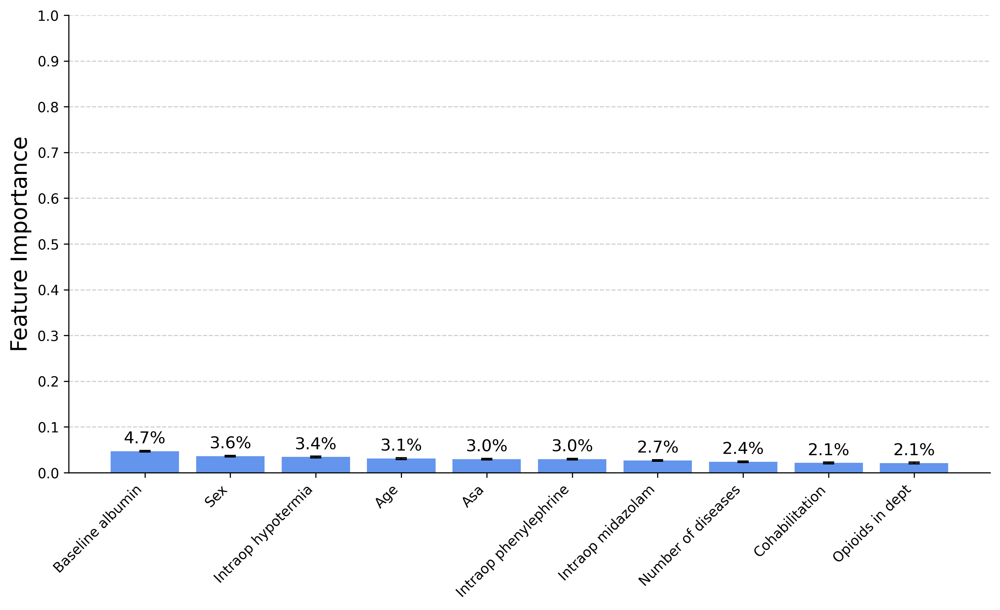

In [15]:
# Get XGBoost model
xgb_model = selected_models['XGBoost']

# Get feature importances and feature names
feature_importance = xgb_model.feature_importances_
features = X_test.columns  # Feature names

# Compute 95% CI error bars (assuming variance from bootstrap or SHAP-based variance)
ci_95 = 1.96 * np.std(feature_importance) / np.sqrt(len(feature_importance))

# Sort features by importance (highest first)
sorted_indices = np.argsort(feature_importance)[::-1]
sorted_features = np.array(features)[sorted_indices]
sorted_importance = feature_importance[sorted_indices]

# Select top 10 features
top_n = 10
top_features = sorted_features[:top_n]
top_importance = sorted_importance[:top_n]

# Format the feature names
top_features_formatted = [format_feature_name(feat) for feat in top_features]

# Compute the total feature importance (for percentage calculation)
total_fi = np.sum(feature_importance)

# Calculate percentage of total FI for each top feature
top_percentages = [(imp / total_fi) * 100 for imp in top_importance]

# Plot the bar chart
plt.figure(figsize=(12, 6))
x_positions = np.arange(top_n)
bars = plt.bar(x_positions, top_importance, color='cornflowerblue', yerr=ci_95, capsize=4)

plt.yticks(np.arange(0, 1.1, 0.1))
plt.ylabel('Feature Importance', fontsize=16)


# Replace x-tick labels with the new labels and rotate for readability
plt.xticks(x_positions, top_features_formatted, rotation=45, ha='right')

# Remove the top and right spines for a cleaner look
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.grid(axis='y', linestyle='--', alpha=0.6)

# Annotate each bar with the percentage value on top
for i, bar in enumerate(bars):
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2.0,  # X coordinate: center of the bar
        height + 0.01,                       # Y coordinate: just above the top of the bar
        f"{top_percentages[i]:.1f}%",         # Text to display
        ha='center',                         # Horizontal alignment
        va='bottom',                         # Vertical alignment
        fontsize=12
    )

plt.show()

## plot shap

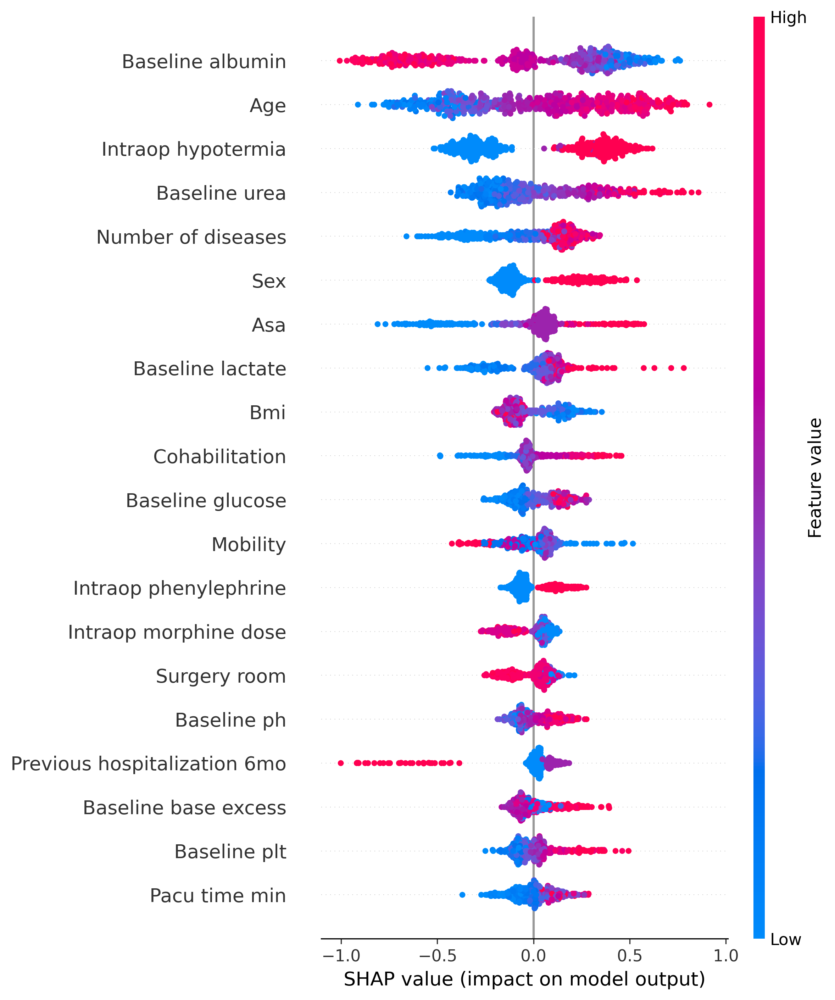

In [16]:
new_feature_names = [name.replace('_', ' ').capitalize() for name in X_test.columns]

# Get the XGBoost model
xgb_model = selected_models['XGBoost']

# Convert X_test to NumPy array if necessary
X_test_input = X_test.values if isinstance(X_test, pd.DataFrame) else X_test

# Create SHAP explainer and compute SHAP values
explainer = shap.Explainer(xgb_model, X_test_input)
shap_values = explainer(X_test_input)

# Plot the SHAP summary plot
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values, X_test, feature_names=new_feature_names)


## voting classifier

In [ ]:
# Initialize individual models
knn = KNeighborsClassifier(n_neighbors=11)
rf = RandomForestClassifier(n_estimators=100, max_depth=7)
catboost = CatBoostClassifier(iterations=100, max_depth=7, learning_rate=0.1, verbose=0)

# Create ensemble model
ensemble = VotingClassifier(estimators=[
    ('knn', knn),
    ('rf', rf),
    ('catboost', catboost)
], voting='soft')


# Dictionaries to store best scores and hyperparameters
ensemble_scores = {}
ensemble_hyperparams = {}
ensemble_model = {}

ensemble.fit(X_train, y_train)

# Evaluate the model
scores = evaluate_model(ensemble, X_test, y_test)
ensemble_scores['ensemble'] = scores


## plot ensembl shap

  0%|          | 0/10 [00:00<?, ?it/s]

/Users/ashuchami/miniconda3/envs/machine_learning/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
/Users/ashuchami/miniconda3/envs/machine_learning/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/Users/ashuchami/miniconda3/envs/machine_learning/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
/Users/ashuchami/miniconda3/envs/machine_learning/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/Users/ashuchami/miniconda3/envs/machine_learning/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: 

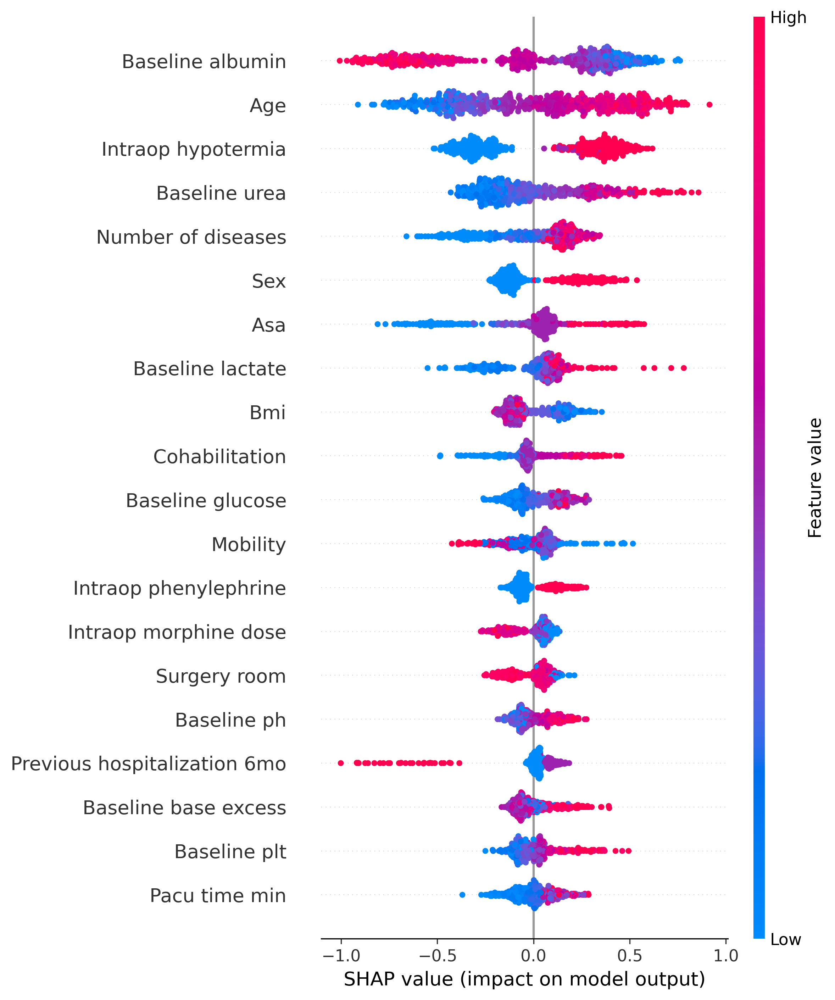

In [24]:
new_feature_names = [name.replace('_', ' ').capitalize() for name in X_test.columns]

# Convert X_test to NumPy array if necessary
X_test_input = X_test.values if isinstance(X_test, pd.DataFrame) else X_test

# Step 1: Select a subset of the test data (e.g., first 50 samples)
subset_size = 10  # Number of samples to include in the subset
X_test_subset = X_test_input[:subset_size]  # Slice the first `subset_size` samples

# Step 2: Compute SHAP values for the subset
shap_values_subset = explainer.shap_values(X_test_subset)

# Plot the SHAP summary plot
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values, X_test, feature_names=new_feature_names)


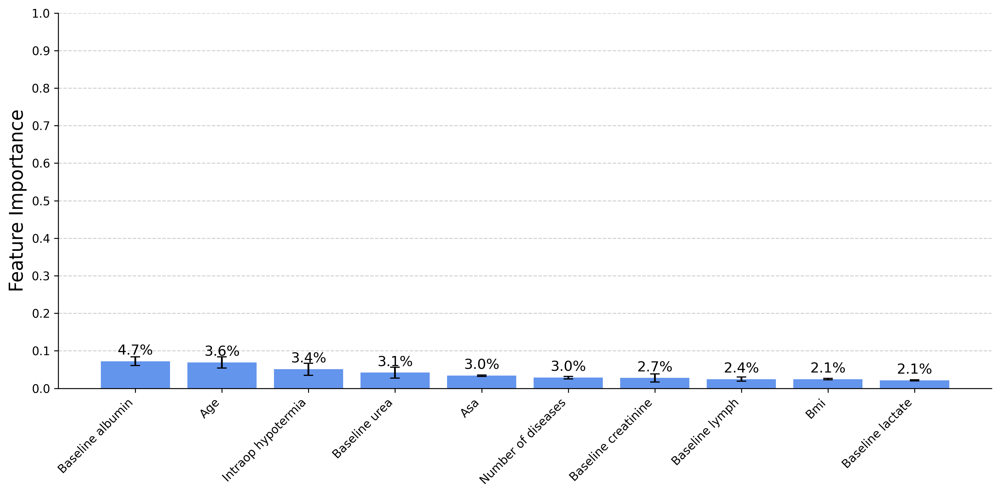

In [51]:


# Assuming ensemble is your ensemble model and X_train is your training data
importances_list = []

# Extract feature importances from each individual model in the ensemble
for model_name, model in ensemble.named_estimators_.items():
    if hasattr(model, 'feature_importances_'):
        # Normalize the feature importances to sum to 1
        normalized_importances = model.feature_importances_ / np.sum(model.feature_importances_)
        importances_list.append(normalized_importances)

# Convert the list into a NumPy array for easy manipulation
importances_array = np.array(importances_list)

# Compute the mean importance across all models
mean_importance = importances_array.mean(axis=0)

# Compute the 95% CI error bars
ci_95 = 1.96 * importances_array.std(axis=0) / np.sqrt(importances_array.shape[0])

# Sort the features by importance (highest first)
sorted_indices = np.argsort(mean_importance)[::-1]

# Get the top 10 features and their importance values
top_n = 10
top_importance = mean_importance[sorted_indices][:top_n]
top_features = X_train.columns[sorted_indices][:top_n]

# Format feature names for better readability (assuming format_feature_name is defined)
top_features_formatted = [format_feature_name(feat) for feat in top_features]

# 6. Plot the bar chart with error bars
plt.figure(figsize=(12, 6))
plt.grid(axis='y', linestyle='--', alpha=0.6)
x_positions = np.arange(top_n)
bars = plt.bar(x_positions, top_importance, color='cornflowerblue', yerr=ci_95[sorted_indices][:top_n], capsize=4)

# Set the y-ticks for readability
plt.yticks(np.arange(0, 1.1, 0.1))
plt.ylabel('Feature Importance', fontsize=16)

# Add feature names as x-ticks and rotate them for better visibility
plt.xticks(x_positions, top_features_formatted, rotation=45, ha='right')

# Customize the plot (removing top and right spines)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
# Annotate each bar with the percentage value on top
for i, bar in enumerate(bars):
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2.0,  # X coordinate: center of the bar
        height + 0.01,                       # Y coordinate: just above the top of the bar
        f"{top_percentages[i]:.1f}%",         # Text to display
        ha='center',                         # Horizontal alignment
        va='bottom',                         # Vertical alignment
        fontsize=12
    )
plt.tight_layout()

plt.show()


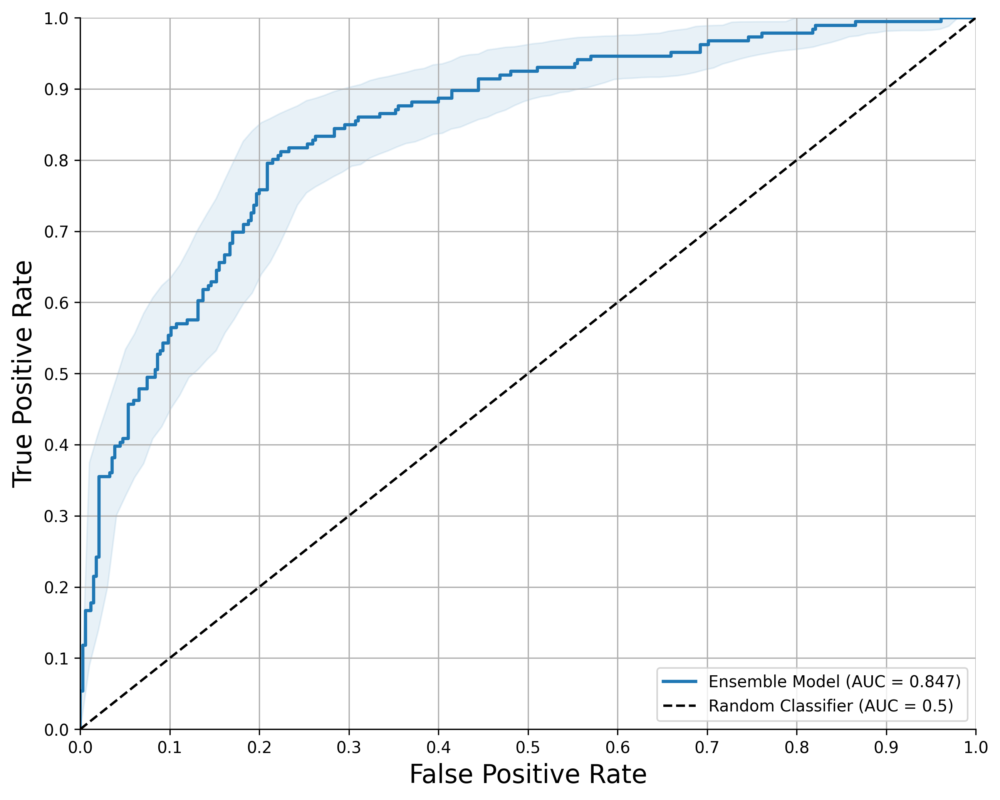

In [53]:

# Ensure reproducibility
rng = np.random.RandomState(42)
# Set up the FPR grid for interpolation
fpr_grid = np.linspace(0, 1, 100)
plt.figure(figsize=(10, 8))
# Number of bootstrap iterations for estimating the CI
n_bootstraps = 1000
# Get predicted probabilities for the positive class
y_pred_prob = ensemble.predict_proba(X_test)[:, 1]
# Compute ROC curve and AUC on the full test set
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)

# Initialize list to hold interpolated TPRs from bootstrapping
bootstrapped_tprs = []

# Bootstrap loop
for i in range(n_bootstraps):
    # Generate bootstrap sample indices (with replacement)
    indices = rng.randint(0, len(y_test), len(y_test))
    
    # Ensure the bootstrap sample contains both classes
    if len(np.unique(y_test.iloc[indices])) < 2:
        continue

    # Compute ROC for the bootstrap sample
    fpr_bs, tpr_bs, _ = roc_curve(y_test.iloc[indices], y_pred_prob[indices])
    
    # Interpolate the bootstrap TPR over the common FPR grid
    tpr_interp = np.interp(fpr_grid, fpr_bs, tpr_bs)
    tpr_interp[0] = 0.0  # Ensure it starts at 0
    bootstrapped_tprs.append(tpr_interp)

bootstrapped_tprs = np.array(bootstrapped_tprs)

# Calculate the 2.5th and 97.5th percentiles for the TPR at each FPR grid point
tprs_lower = np.percentile(bootstrapped_tprs, 2.5, axis=0)
tprs_upper = np.percentile(bootstrapped_tprs, 97.5, axis=0)

# Plot the ROC curve for the ensemble model
line, = plt.plot(fpr, tpr, lw=2, label=f'Ensemble Model (AUC = {roc_auc:.3f})')

# Add a thin black outline to the line
line.set_path_effects([
    PathEffects.Stroke(linewidth=1, foreground='black'),
    PathEffects.Normal()
])

# Plot the 95% CI as a shaded area with the same color as the ROC curve
plt.fill_between(fpr_grid, tprs_lower, tprs_upper, color=line.get_color(), alpha=0.1)

# Plot the diagonal line (random classifier)
plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier (AUC = 0.5)')

# Customize the plot
plt.xlabel('False Positive Rate', fontsize=16)
plt.ylabel('True Positive Rate', fontsize=16)
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.xticks(np.arange(0, 1.1, 0.1))
plt.yticks(np.arange(0, 1.1, 0.1))

# Remove the top and right border lines (spines)
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.legend(loc='lower right')
plt.grid(True)
plt.show()